# IMPORTS


In [1]:
import torch, numpy as np
import torch.nn as nn
import torch.optim as optim
from torchvision.datasets import CIFAR10, MNIST
from torch.utils.data import DataLoader, TensorDataset
from tqdm.notebook import tqdm
import torchvision.transforms as transforms
import torch.nn.functional as F
import os
from torchvision import utils
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
import numpy as np
from torch.optim.lr_scheduler import StepLR
from torchvision.models import inception_v3
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import seaborn as sns

# DATA PREP

In [ ]:
# put in train.py
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,0.5,0.5),(0.5,0.5,0.5))
])

trainset = CIFAR10(root='./data', train=True, download=True, transform=transform)
trainloader = DataLoader(trainset, batch_size=64, shuffle=True)
testset = CIFAR10(root='./data', train=False, download=True, transform=transform)
testloader = DataLoader(testset, batch_size=64, shuffle=False)

# MODEL

In [3]:
class Generator(nn.Module):
    def __init__(self, z_dim=128, img_channels=3):
        super(Generator, self).__init__()
        self.model = nn.Sequential(
            nn.ConvTranspose2d(z_dim, 512, 4, 1, 0),  # 1x1 -> 4x4
            nn.BatchNorm2d(512),
            nn.ReLU(True),

            nn.ConvTranspose2d(512, 256, 4, 2, 1),    # 4x4 -> 8x8
            nn.BatchNorm2d(256),
            nn.ReLU(True),

            nn.ConvTranspose2d(256, 128, 4, 2, 1),    # 8x8 -> 16x16
            nn.BatchNorm2d(128),
            nn.ReLU(True),

            nn.ConvTranspose2d(128, 64, 4, 2, 1),     # 16x16 -> 32x32
            nn.BatchNorm2d(64),
            nn.ReLU(True),

            nn.ConvTranspose2d(64, img_channels, 3, 1, 1), # keep 32x32
            nn.Tanh()
        )

    def forward(self, z):
        return self.model(z)


class Discriminator(nn.Module):
    def __init__(self, img_channels=3):
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Conv2d(img_channels, 64, 4, 2, 1),  # 32x32 -> 16x16
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(64, 128, 4, 2, 1),           # 16x16 -> 8x8
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(128, 256, 4, 2, 1),          # 8x8 -> 4x4
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(256, 512, 4, 2, 1),          # 4x4 -> 2x2
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Flatten(),
            nn.Linear(512*2*2, 1)                   # output single score
        )

    def forward(self, x):
        return self.model(x).view(-1)


In [4]:
class ConvVAE(nn.Module):
    def __init__(self, z_dim=128):
        super(ConvVAE, self).__init__()

        # ---------- Encoder ----------
        self.enc = nn.Sequential(
            nn.Conv2d(3, 64, 4, 2, 1),   # 32x32 -> 16x16
            nn.BatchNorm2d(64),
            nn.ReLU(),

            nn.Conv2d(64, 128, 4, 2, 1), # 16x16 -> 8x8
            nn.BatchNorm2d(128),
            nn.ReLU(),

            nn.Conv2d(128, 256, 4, 2, 1), # 8x8 -> 4x4
            nn.BatchNorm2d(256),
            nn.ReLU(),

            nn.Conv2d(256, 512, 4, 1, 0), # 4x4 -> 1x1
            nn.ReLU(),
            nn.Flatten()
        )

        self.fc_mu = nn.Linear(512*1*1, z_dim)
        self.fc_logvar = nn.Linear(512*1*1, z_dim)

        # ---------- Decoder ----------
        self.dec_fc = nn.Linear(z_dim, 512)

        self.dec = nn.Sequential(
            nn.Unflatten(1, (512, 1, 1)),
            nn.ConvTranspose2d(512, 256, 4, 1, 0),  # 1x1 -> 4x4
            nn.BatchNorm2d(256),
            nn.ReLU(),

            nn.ConvTranspose2d(256, 128, 4, 2, 1),  # 4x4 -> 8x8
            nn.BatchNorm2d(128),
            nn.ReLU(),

            nn.ConvTranspose2d(128, 64, 4, 2, 1),   # 8x8 -> 16x16
            nn.BatchNorm2d(64),
            nn.ReLU(),

            nn.ConvTranspose2d(64, 3, 4, 2, 1),     # 16x16 -> 32x32
            nn.Tanh()
        )

    # ---------- Encoder ----------
    def encode(self, x):
        h = self.enc(x)
        return self.fc_mu(h), self.fc_logvar(h)

    # ---------- Reparameterization ----------
    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5*logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    # ---------- Decoder ----------
    def decode(self, z):
        h = self.dec_fc(z)
        return self.dec(h)

    # ---------- Forward ----------
    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        recon = self.decode(z)
        return recon, mu, logvar


In [5]:
def vae_loss(recon_x, x, mu, logvar, recon_weight=1.0, beta=1.0):
    # if using normalized inputs in [-1,1], use MSE
    recon_loss = F.mse_loss(recon_x, x, reduction='sum')  # sum over batch
    kld = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
    return recon_weight*recon_loss + beta*kld, recon_loss.item(), kld.item()

In [6]:
device = torch.device("mps")

## TRAINING

In [7]:
vae = ConvVAE(z_dim=128).to(device)
opt_vae = optim.Adam(vae.parameters(), lr=1e-3)
scheduler = StepLR(opt_vae, step_size=10, gamma=0.5)

epochs = 50
os.makedirs("vae_1_checkpoints", exist_ok=True)
os.makedirs("vae_1_samples", exist_ok=True)


  0%|          | 0/782 [00:00<?, ?it/s]

[VAE] Epoch 1/50, Loss=352.0862


  0%|          | 0/782 [00:00<?, ?it/s]

[VAE] Epoch 2/50, Loss=250.0483


  0%|          | 0/782 [00:00<?, ?it/s]

[VAE] Epoch 3/50, Loss=233.7730


  0%|          | 0/782 [00:00<?, ?it/s]

[VAE] Epoch 4/50, Loss=226.2723


  0%|          | 0/782 [00:00<?, ?it/s]

[VAE] Epoch 5/50, Loss=220.7313


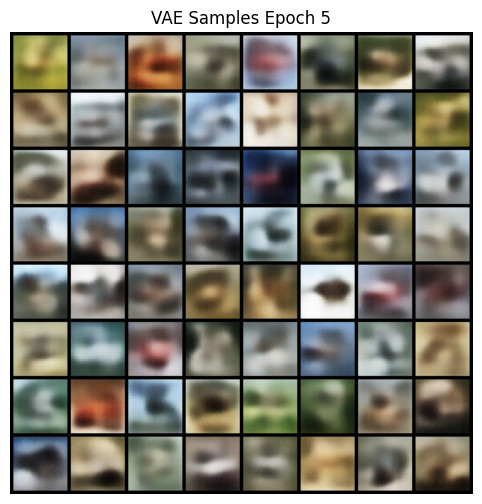

  0%|          | 0/782 [00:00<?, ?it/s]

[VAE] Epoch 6/50, Loss=216.7853


  0%|          | 0/782 [00:00<?, ?it/s]

[VAE] Epoch 7/50, Loss=214.3119


  0%|          | 0/782 [00:00<?, ?it/s]

[VAE] Epoch 8/50, Loss=212.1041


  0%|          | 0/782 [00:00<?, ?it/s]

[VAE] Epoch 9/50, Loss=210.7108


  0%|          | 0/782 [00:00<?, ?it/s]

[VAE] Epoch 10/50, Loss=209.2170


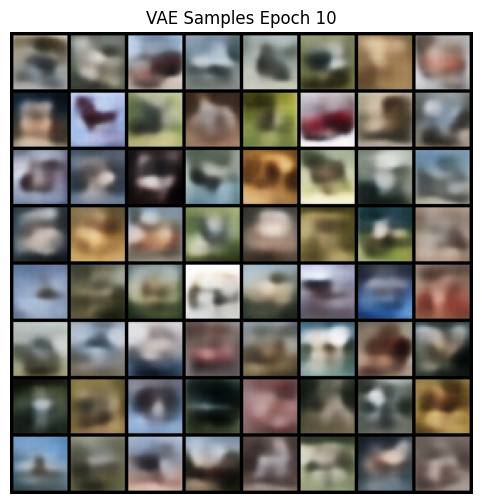

  0%|          | 0/782 [00:00<?, ?it/s]

[VAE] Epoch 11/50, Loss=203.5256


  0%|          | 0/782 [00:00<?, ?it/s]

[VAE] Epoch 12/50, Loss=203.1367


  0%|          | 0/782 [00:00<?, ?it/s]

[VAE] Epoch 13/50, Loss=202.4867


  0%|          | 0/782 [00:00<?, ?it/s]

[VAE] Epoch 14/50, Loss=201.5229


  0%|          | 0/782 [00:00<?, ?it/s]

[VAE] Epoch 15/50, Loss=200.7587


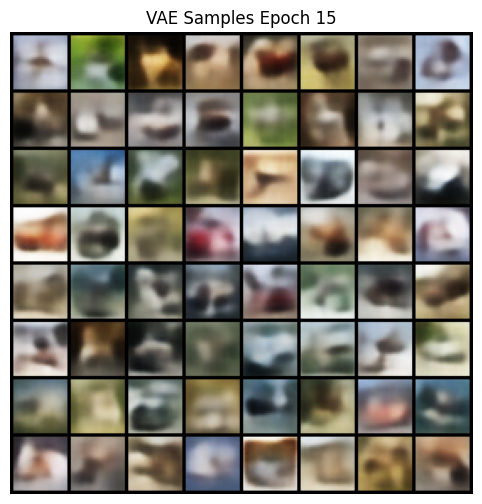

  0%|          | 0/782 [00:00<?, ?it/s]

[VAE] Epoch 16/50, Loss=200.4380


  0%|          | 0/782 [00:00<?, ?it/s]

[VAE] Epoch 17/50, Loss=199.6306


  0%|          | 0/782 [00:00<?, ?it/s]

[VAE] Epoch 18/50, Loss=199.0216


  0%|          | 0/782 [00:00<?, ?it/s]

[VAE] Epoch 19/50, Loss=198.3329


  0%|          | 0/782 [00:00<?, ?it/s]

[VAE] Epoch 20/50, Loss=197.7342


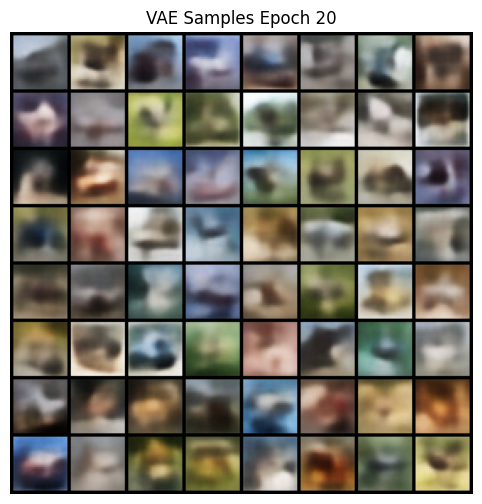

  0%|          | 0/782 [00:00<?, ?it/s]

[VAE] Epoch 21/50, Loss=195.0120


  0%|          | 0/782 [00:00<?, ?it/s]

[VAE] Epoch 22/50, Loss=194.6322


  0%|          | 0/782 [00:00<?, ?it/s]

[VAE] Epoch 23/50, Loss=194.2937


  0%|          | 0/782 [00:00<?, ?it/s]

[VAE] Epoch 24/50, Loss=194.1408


  0%|          | 0/782 [00:00<?, ?it/s]

[VAE] Epoch 25/50, Loss=193.5899


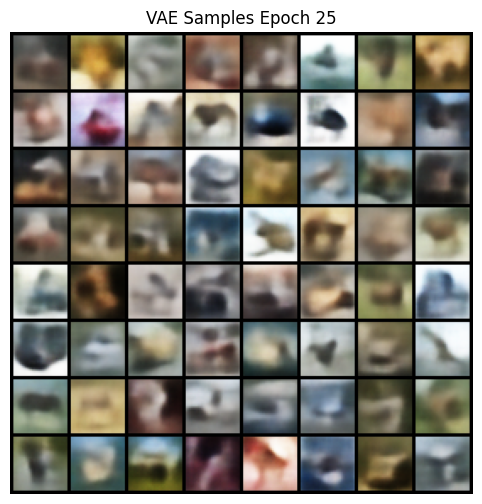

  0%|          | 0/782 [00:00<?, ?it/s]

[VAE] Epoch 26/50, Loss=193.3231


  0%|          | 0/782 [00:00<?, ?it/s]

[VAE] Epoch 27/50, Loss=193.1544


  0%|          | 0/782 [00:00<?, ?it/s]

[VAE] Epoch 28/50, Loss=192.9404


  0%|          | 0/782 [00:00<?, ?it/s]

[VAE] Epoch 29/50, Loss=192.6652


  0%|          | 0/782 [00:00<?, ?it/s]

[VAE] Epoch 30/50, Loss=192.4966


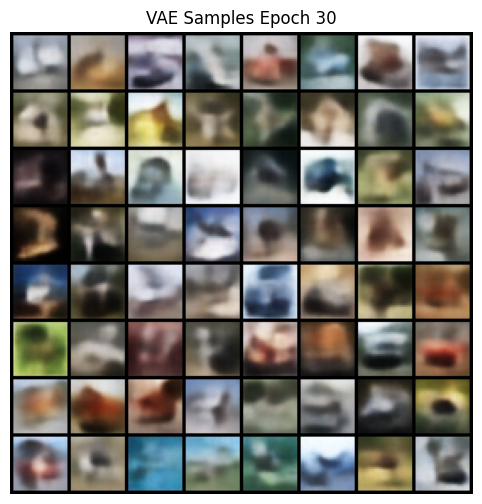

  0%|          | 0/782 [00:00<?, ?it/s]

[VAE] Epoch 31/50, Loss=191.0719


  0%|          | 0/782 [00:00<?, ?it/s]

[VAE] Epoch 32/50, Loss=190.8730


  0%|          | 0/782 [00:00<?, ?it/s]

[VAE] Epoch 33/50, Loss=190.6501


  0%|          | 0/782 [00:00<?, ?it/s]

[VAE] Epoch 34/50, Loss=190.5993


  0%|          | 0/782 [00:00<?, ?it/s]

[VAE] Epoch 35/50, Loss=190.4369


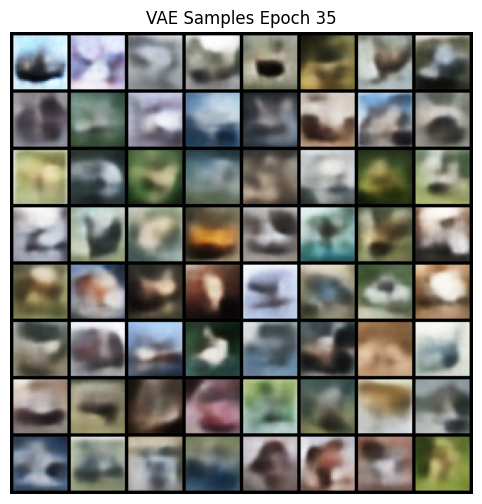

  0%|          | 0/782 [00:00<?, ?it/s]

[VAE] Epoch 36/50, Loss=190.2813


  0%|          | 0/782 [00:00<?, ?it/s]

[VAE] Epoch 37/50, Loss=190.1862


  0%|          | 0/782 [00:00<?, ?it/s]

[VAE] Epoch 38/50, Loss=189.8690


  0%|          | 0/782 [00:00<?, ?it/s]

[VAE] Epoch 39/50, Loss=190.0148


  0%|          | 0/782 [00:00<?, ?it/s]

[VAE] Epoch 40/50, Loss=189.7808


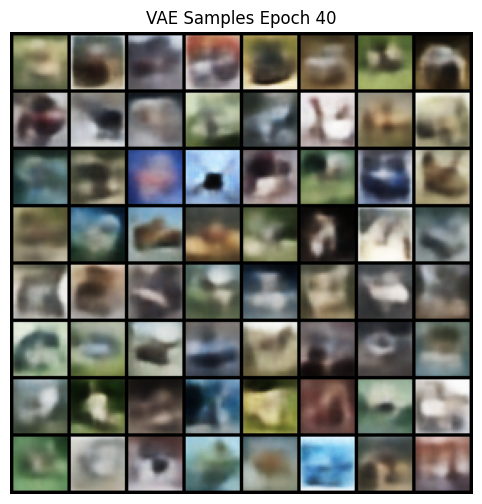

  0%|          | 0/782 [00:00<?, ?it/s]

[VAE] Epoch 41/50, Loss=189.0063


  0%|          | 0/782 [00:00<?, ?it/s]

[VAE] Epoch 42/50, Loss=188.9650


  0%|          | 0/782 [00:00<?, ?it/s]

[VAE] Epoch 43/50, Loss=188.8265


  0%|          | 0/782 [00:00<?, ?it/s]

[VAE] Epoch 44/50, Loss=188.8521


  0%|          | 0/782 [00:00<?, ?it/s]

[VAE] Epoch 45/50, Loss=188.8068


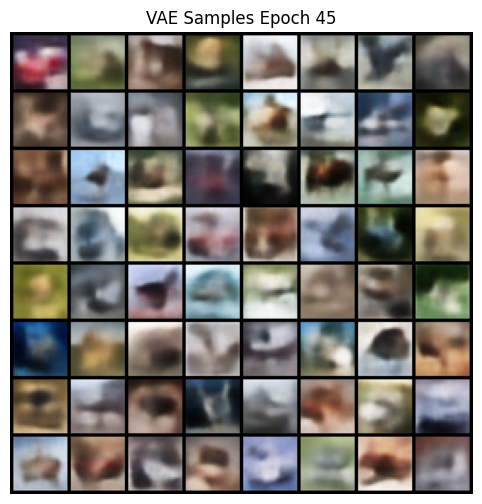

  0%|          | 0/782 [00:00<?, ?it/s]

[VAE] Epoch 46/50, Loss=188.6241


  0%|          | 0/782 [00:00<?, ?it/s]

[VAE] Epoch 47/50, Loss=188.5281


  0%|          | 0/782 [00:00<?, ?it/s]

[VAE] Epoch 48/50, Loss=188.5092


  0%|          | 0/782 [00:00<?, ?it/s]

[VAE] Epoch 49/50, Loss=188.4630


  0%|          | 0/782 [00:00<?, ?it/s]

[VAE] Epoch 50/50, Loss=188.3692


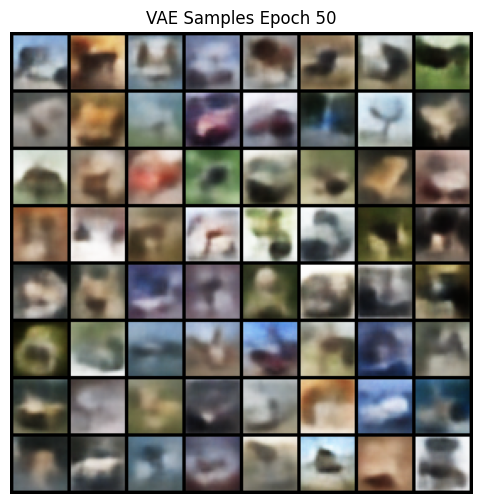

In [9]:
for epoch in range(epochs):
    vae.train()
    total_loss = 0
    for imgs, _ in tqdm(trainloader):
        imgs = imgs.to(device)
        opt_vae.zero_grad()
        recon, mu, logvar = vae(imgs)
        loss, rloss, kld = vae_loss(recon, imgs, mu, logvar)
        loss.backward()
        opt_vae.step()
        total_loss += loss.item()
    scheduler.step()
    print(f"[VAE] Epoch {epoch+1}/{epochs}, Loss={total_loss/len(trainset):.4f}")

    # Generate and save samples, checkpoints every 5 epochs
    if (epoch + 1) % 5 == 0:
        vae.eval()
        with torch.no_grad():
            # Generate random samples
            sample = vae.decode(torch.randn(64, vae.fc_mu.out_features, device=device)).cpu()
            utils.save_image((sample + 1) / 2,
                             f"vae_1_samples/vae_sample_epoch{epoch+1}.png",
                             nrow=8)

            grid = utils.make_grid((sample + 1)/2, nrow=8)
            plt.figure(figsize=(12,6))
            plt.imshow(grid.permute(1,2,0))
            plt.axis('off')
            plt.title(f"VAE Samples Epoch {epoch+1}")
            plt.show()

            # Save checkpoint
            torch.save(vae.state_dict(), f"vae_1_checkpoints/vae_epoch{epoch+1}.pth")


In [ ]:
z_dim = 128
gen = Generator(z_dim).to(device)
disc = Discriminator().to(device)

opt_g = optim.Adam(gen.parameters(), lr=2e-4, betas=(0.5,0.999))
opt_d = optim.Adam(disc.parameters(), lr=2e-4, betas=(0.5,0.999))

scheduler_g = StepLR(opt_g, step_size=10, gamma=0.5)
scheduler_d = StepLR(opt_d, step_size=10, gamma=0.5)

criterion = nn.BCEWithLogitsLoss()

epochs = 50
fixed_noise = torch.randn(64, z_dim, 1, 1, device=device)

os.makedirs("gan_1_checkpoints", exist_ok=True)
os.makedirs("gan_1_samples", exist_ok=True)

  0%|          | 0/782 [00:00<?, ?it/s]

[GAN] Epoch 1/50, D Loss=0.2727, G Loss=2.8524


  0%|          | 0/782 [00:00<?, ?it/s]

[GAN] Epoch 2/50, D Loss=0.5210, G Loss=4.0219


  0%|          | 0/782 [00:00<?, ?it/s]

[GAN] Epoch 3/50, D Loss=0.3161, G Loss=2.6976


  0%|          | 0/782 [00:00<?, ?it/s]

[GAN] Epoch 4/50, D Loss=0.3256, G Loss=1.7149


  0%|          | 0/782 [00:00<?, ?it/s]

[GAN] Epoch 5/50, D Loss=0.3404, G Loss=1.9336


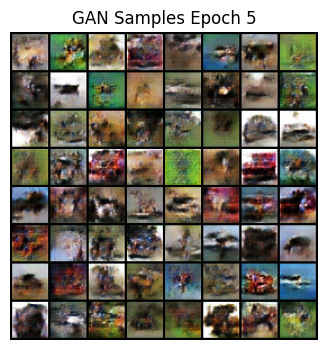

  0%|          | 0/782 [00:00<?, ?it/s]

[GAN] Epoch 6/50, D Loss=0.5596, G Loss=2.6668


  0%|          | 0/782 [00:00<?, ?it/s]

[GAN] Epoch 7/50, D Loss=0.3286, G Loss=4.4810


  0%|          | 0/782 [00:00<?, ?it/s]

[GAN] Epoch 8/50, D Loss=0.3820, G Loss=2.4267


  0%|          | 0/782 [00:00<?, ?it/s]

[GAN] Epoch 9/50, D Loss=0.3692, G Loss=2.6423


  0%|          | 0/782 [00:00<?, ?it/s]

[GAN] Epoch 10/50, D Loss=0.6338, G Loss=1.3798


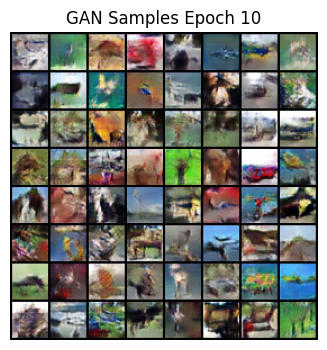

  0%|          | 0/782 [00:00<?, ?it/s]

[GAN] Epoch 11/50, D Loss=0.5014, G Loss=1.1728


  0%|          | 0/782 [00:00<?, ?it/s]

[GAN] Epoch 12/50, D Loss=0.9041, G Loss=2.1003


  0%|          | 0/782 [00:00<?, ?it/s]

[GAN] Epoch 13/50, D Loss=0.6438, G Loss=1.5248


  0%|          | 0/782 [00:00<?, ?it/s]

[GAN] Epoch 14/50, D Loss=0.3142, G Loss=1.5265


  0%|          | 0/782 [00:00<?, ?it/s]

[GAN] Epoch 15/50, D Loss=0.3064, G Loss=0.7893


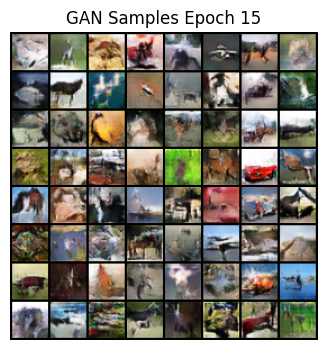

  0%|          | 0/782 [00:00<?, ?it/s]

[GAN] Epoch 16/50, D Loss=0.2038, G Loss=3.9086


  0%|          | 0/782 [00:00<?, ?it/s]

[GAN] Epoch 17/50, D Loss=0.6479, G Loss=1.5821


  0%|          | 0/782 [00:00<?, ?it/s]

[GAN] Epoch 18/50, D Loss=0.2377, G Loss=3.7168


  0%|          | 0/782 [00:00<?, ?it/s]

[GAN] Epoch 19/50, D Loss=0.2889, G Loss=4.0605


  0%|          | 0/782 [00:00<?, ?it/s]

[GAN] Epoch 20/50, D Loss=0.2424, G Loss=3.1760


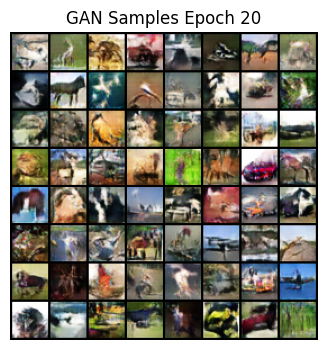

  0%|          | 0/782 [00:00<?, ?it/s]

[GAN] Epoch 21/50, D Loss=0.1790, G Loss=1.8285


  0%|          | 0/782 [00:00<?, ?it/s]

[GAN] Epoch 22/50, D Loss=0.1914, G Loss=3.6785


  0%|          | 0/782 [00:00<?, ?it/s]

[GAN] Epoch 23/50, D Loss=0.3661, G Loss=1.4207


  0%|          | 0/782 [00:00<?, ?it/s]

[GAN] Epoch 24/50, D Loss=0.4365, G Loss=1.1466


  0%|          | 0/782 [00:00<?, ?it/s]

[GAN] Epoch 25/50, D Loss=0.2769, G Loss=4.6989


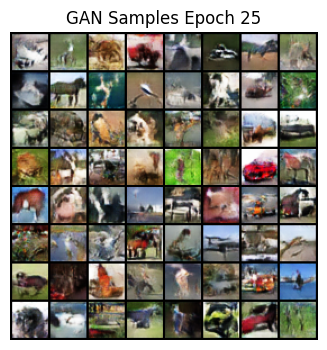

  0%|          | 0/782 [00:00<?, ?it/s]

[GAN] Epoch 26/50, D Loss=0.2326, G Loss=0.6266


  0%|          | 0/782 [00:00<?, ?it/s]

[GAN] Epoch 27/50, D Loss=0.6059, G Loss=2.5072


  0%|          | 0/782 [00:00<?, ?it/s]

[GAN] Epoch 28/50, D Loss=0.3950, G Loss=2.8351


  0%|          | 0/782 [00:00<?, ?it/s]

[GAN] Epoch 29/50, D Loss=0.2204, G Loss=7.3350


  0%|          | 0/782 [00:00<?, ?it/s]

[GAN] Epoch 30/50, D Loss=0.2553, G Loss=8.8883


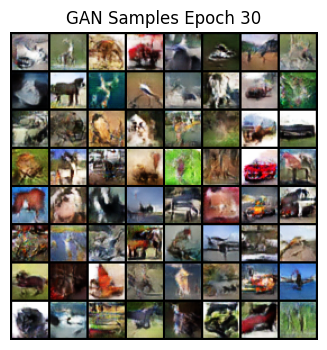

  0%|          | 0/782 [00:00<?, ?it/s]

[GAN] Epoch 31/50, D Loss=0.1836, G Loss=2.7119


  0%|          | 0/782 [00:00<?, ?it/s]

[GAN] Epoch 32/50, D Loss=0.3733, G Loss=3.3199


  0%|          | 0/782 [00:00<?, ?it/s]

[GAN] Epoch 33/50, D Loss=0.3405, G Loss=3.5859


  0%|          | 0/782 [00:00<?, ?it/s]

[GAN] Epoch 34/50, D Loss=0.2032, G Loss=2.0855


  0%|          | 0/782 [00:00<?, ?it/s]

[GAN] Epoch 35/50, D Loss=0.3596, G Loss=2.9875


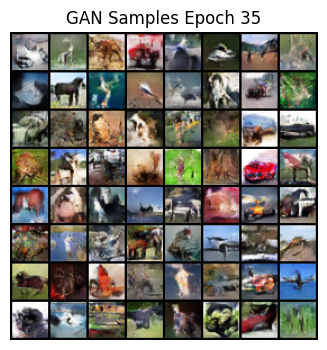

  0%|          | 0/782 [00:00<?, ?it/s]

[GAN] Epoch 36/50, D Loss=0.2311, G Loss=1.9801


  0%|          | 0/782 [00:00<?, ?it/s]

[GAN] Epoch 37/50, D Loss=0.2121, G Loss=3.2724


  0%|          | 0/782 [00:00<?, ?it/s]

[GAN] Epoch 38/50, D Loss=0.3309, G Loss=4.0586


  0%|          | 0/782 [00:00<?, ?it/s]

[GAN] Epoch 39/50, D Loss=0.2626, G Loss=3.7873


  0%|          | 0/782 [00:00<?, ?it/s]

[GAN] Epoch 40/50, D Loss=0.3080, G Loss=6.6514


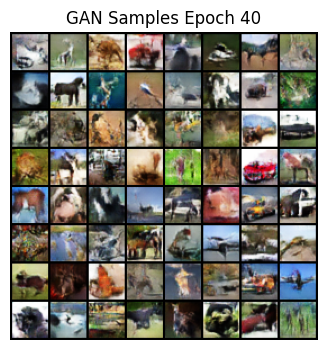

  0%|          | 0/782 [00:00<?, ?it/s]

[GAN] Epoch 41/50, D Loss=0.4138, G Loss=4.4967


  0%|          | 0/782 [00:00<?, ?it/s]

[GAN] Epoch 42/50, D Loss=0.2294, G Loss=5.3336


  0%|          | 0/782 [00:00<?, ?it/s]

[GAN] Epoch 43/50, D Loss=0.2629, G Loss=2.6092


  0%|          | 0/782 [00:00<?, ?it/s]

[GAN] Epoch 44/50, D Loss=0.2100, G Loss=4.8009


  0%|          | 0/782 [00:00<?, ?it/s]

[GAN] Epoch 45/50, D Loss=0.3945, G Loss=2.7960


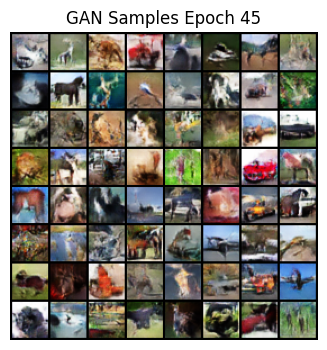

  0%|          | 0/782 [00:00<?, ?it/s]

[GAN] Epoch 46/50, D Loss=0.4678, G Loss=1.8332


  0%|          | 0/782 [00:00<?, ?it/s]

[GAN] Epoch 47/50, D Loss=0.4200, G Loss=4.9427


  0%|          | 0/782 [00:00<?, ?it/s]

[GAN] Epoch 48/50, D Loss=0.8333, G Loss=2.5447


  0%|          | 0/782 [00:00<?, ?it/s]

[GAN] Epoch 49/50, D Loss=0.2329, G Loss=4.2631


  0%|          | 0/782 [00:00<?, ?it/s]

[GAN] Epoch 50/50, D Loss=0.1782, G Loss=3.4282


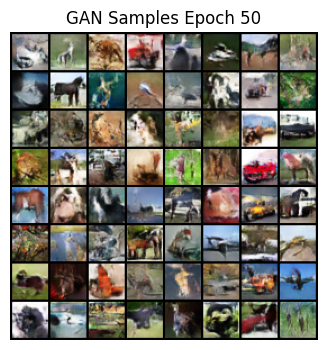

In [7]:
for epoch in range(epochs):
    gen.train()
    disc.train()
    for real, _ in tqdm(trainloader):
        real = real.to(device)
        bs = real.size(0)

        # ----------------------
        # Train Discriminator
        # ----------------------
        noise = torch.randn(bs, z_dim, 1, 1, device=device)
        fake = gen(noise).detach()
        loss_real = criterion(disc(real), torch.ones(bs, device=device)*0.9) # label smoothing
        loss_fake = criterion(disc(fake), torch.zeros(bs, device=device))
        d_loss = (loss_real + loss_fake)/2

        opt_d.zero_grad()
        d_loss.backward()
        opt_d.step()

        # ----------------------
        # Train Generator
        # ----------------------
        noise = torch.randn(bs, z_dim, 1, 1, device=device)
        fake = gen(noise)
        g_loss = criterion(disc(fake), torch.ones(bs, device=device))
        opt_g.zero_grad()
        g_loss.backward()
        opt_g.step()

    # Step schedulers
    scheduler_g.step()
    scheduler_d.step()

    print(f"[GAN] Epoch {epoch+1}/{epochs}, D Loss={d_loss.item():.4f}, G Loss={g_loss.item():.4f}")

    # Save samples & checkpoints every 5 epochs
    if (epoch+1) % 5 == 0:
        gen.eval()
        with torch.no_grad():
            fake = gen(fixed_noise).cpu()
            utils.save_image((fake+1)/2, f"gan_1_samples/gan_sample_epoch{epoch+1}.png", nrow=8)
            torch.save(gen.state_dict(), f"gan_1_checkpoints/gan_gen_epoch{epoch+1}.pth")
            torch.save(disc.state_dict(), f"gan_1_checkpoints/gan_disc_epoch{epoch+1}.pth")
            grid = utils.make_grid(fake, nrow=8, normalize=True)
            plt.figure(figsize=(20,4))
            plt.imshow(grid.permute(1, 2, 0).cpu().numpy())
            plt.axis('off')
            plt.title(f"GAN Samples Epoch {epoch+1}")
            plt.show()


### Vision Quality Check

In [9]:
# Utility: denormalize [-1,1] -> [0,1]
def denorm(x):
    return (x * 0.5) + 0.5

def show_grid(tensor, title=None, nrow=8, figsize=(8,8)):
    grid = make_grid(denorm(tensor.detach().cpu()), nrow=nrow, pad_value=1.0)
    npimg = grid.permute(1,2,0).numpy()
    plt.figure(figsize=figsize)
    plt.axis('off')
    if title: plt.title(title)
    plt.imshow(npimg)
    plt.show()

In [10]:
def compare_recon_vs_gen(vae, gen, testloader, device, n=16, z_dim=64):
    # fetch one batch of test images
    imgs, _ = next(iter(testloader))
    imgs = imgs[:n].to(device)

    vae.eval(); gen.eval()
    with torch.no_grad():
        # VAE reconstructions — use encoder mean (mu) for deterministic recon
        mu, logvar = vae.encode(imgs)           # shape (n, z_dim)
        recon = vae.decode(mu)                  # expects (n, z_dim) -> (n,3,32,32)

        # GAN samples — random noise (N, z_dim, 1, 1)
        noise = torch.randn(n, z_dim, 1, 1, device=device)
        gen_samples = gen(noise)                # (n,3,32,32)

    # display grids
    grid_nrow = int(np.sqrt(n)) if int(np.sqrt(n))**2 == n else min(8, n)
    show_grid(imgs, title="Original test images", nrow=grid_nrow)
    show_grid(recon, title="VAE reconstructions (mu -> decode)", nrow=grid_nrow)
    show_grid(gen_samples, title="GAN random samples", nrow=grid_nrow)

    # compute average pixel MSE and PSNR (on [0,1] images)
    imgs_01 = denorm(imgs)
    recon_01 = denorm(recon)
    mse = F.mse_loss(recon_01, imgs_01, reduction='mean').item()
    psnr = 10 * np.log10(1.0 / mse) if mse>0 else float('inf')

    print(f"VAE reconstruction MSE (per-pixel, [0,1] range): {mse:.6e}")
    print(f"VAE reconstruction PSNR: {psnr:.2f} dB")

    return imgs, recon, gen_samples

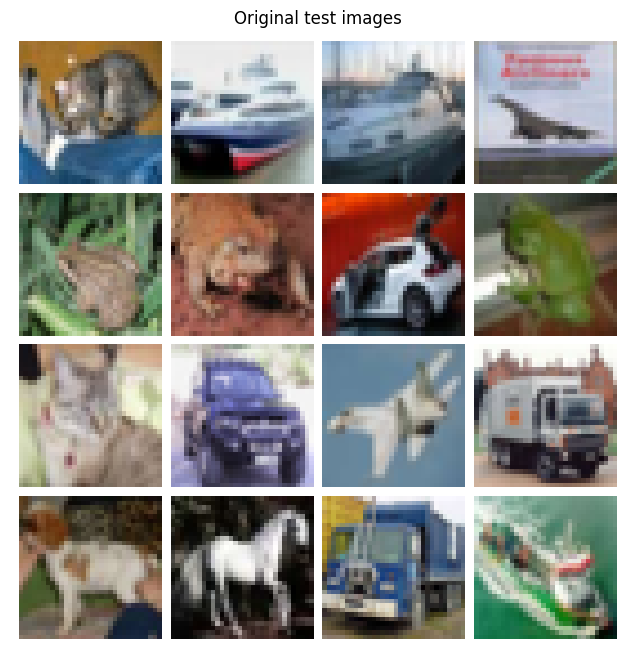

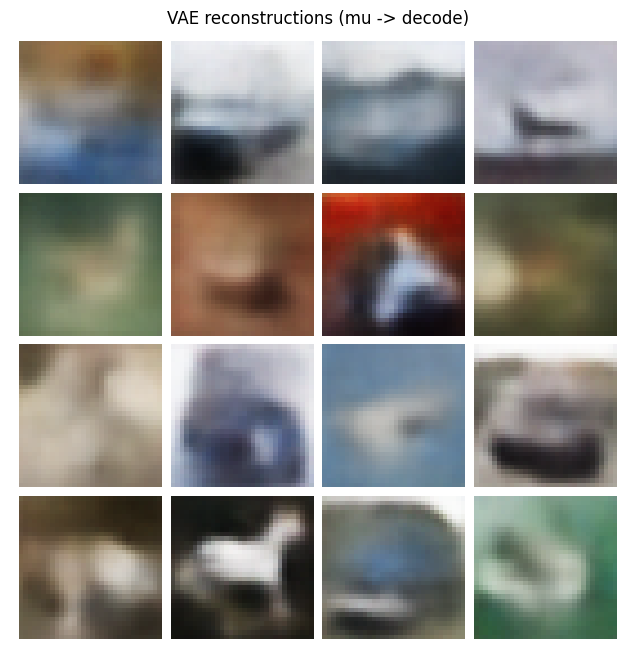

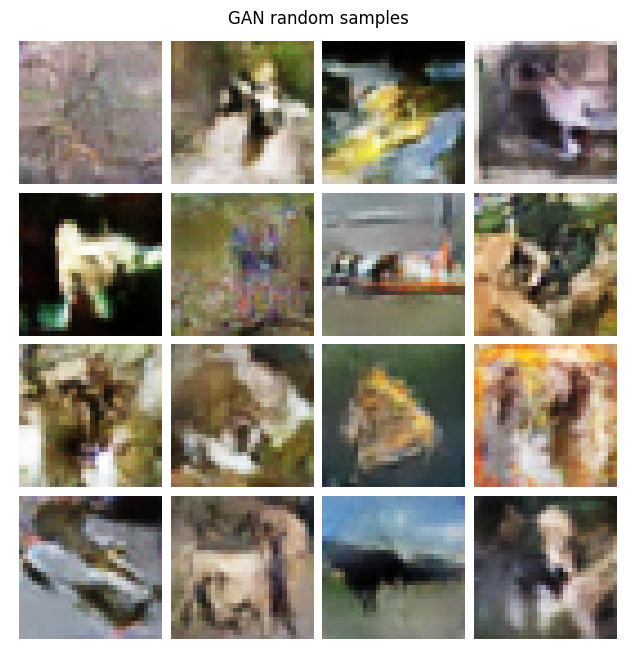

VAE reconstruction MSE (per-pixel, [0,1] range): 1.297274e-02
VAE reconstruction PSNR: 18.87 dB


In [11]:
vae = ConvVAE(z_dim=128).to(device)
vae.load_state_dict(torch.load("vae_1_checkpoints/vae_epoch50.pth", map_location=device))
vae.eval()
gen = Generator(z_dim=128).to(device)
gen.load_state_dict(torch.load("gan_1_checkpoints/gan_gen_epoch50.pth", map_location=device))
gen.eval()

imgs, recon, gen_samples = compare_recon_vs_gen(vae, gen, testloader, device, n=16, z_dim=128)

### Diversity Check

In [12]:
# --- VAE samples ---
vae_samples = []
vae.eval()
with torch.no_grad():
    for _ in range(10):  # 10 x 100 = 1000
        z = torch.randn(100, 128, device=device)  # latent vectors (flattened for VAE)
        imgs = vae.decode(z)                     # decode from latent
        vae_samples.append(imgs.cpu())
vae_samples = torch.cat(vae_samples, dim=0)  # shape: (1000, 3, H, W)

In [13]:
# --- GAN samples ---
gan_samples = []
gen.eval()
with torch.no_grad():
    for _ in range(10):  # 10 x 100 = 1000
        z = torch.randn(100, 128, 1, 1, device=device)  # latent vectors
        imgs = gen(z)
        gan_samples.append(imgs.cpu())
gan_samples = torch.cat(gan_samples, dim=0)  # shape: (1000, 3, H, W)

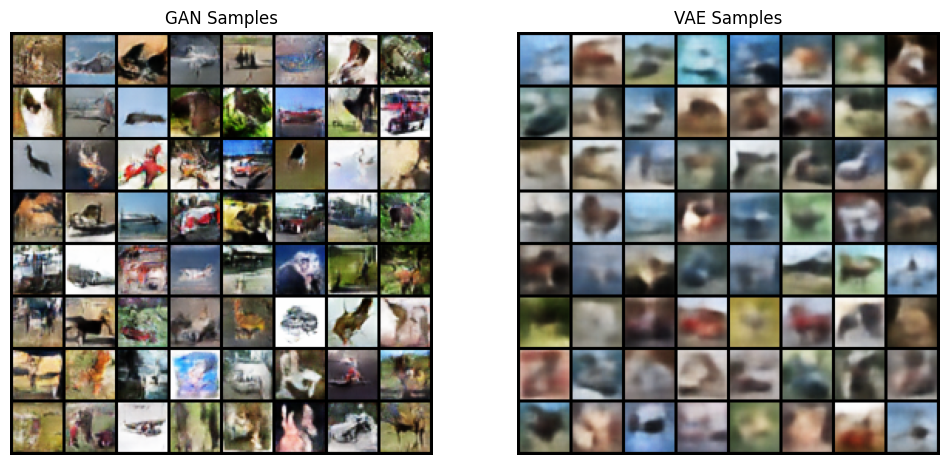

In [14]:
gan_grid = make_grid(gan_samples[:64], nrow=8, normalize=True, value_range=(-1, 1))
vae_grid = make_grid(vae_samples[:64], nrow=8, normalize=True, value_range=(-1, 1))

# Plot them
plt.figure(figsize=(12,6))

plt.subplot(1,2,1)
plt.imshow(gan_grid.permute(1, 2, 0).numpy())
plt.title("GAN Samples")
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(vae_grid.permute(1, 2, 0).numpy())
plt.title("VAE Samples")
plt.axis("off")

plt.show()

### Metrics Check

In [15]:
vae.eval()
recon_errors = []

with torch.no_grad():
    for x, _ in testloader:
        x = x.to(device)
        recon, _, _ = vae(x)   # forward pass: outputs reconstruction
        mse = F.mse_loss(recon, x, reduction='none')  # pixelwise MSE
        mse = mse.view(mse.size(0), -1).mean(dim=1)   # per-image error
        recon_errors.extend(mse.cpu().numpy())

avg_recon_error = np.mean(recon_errors)
print(f"Average VAE reconstruction error (MSE per pixel): {avg_recon_error:.6f}")

Average VAE reconstruction error (MSE per pixel): 0.048566


In [16]:
inception = inception_v3(pretrained=True, transform_input=False).to(device)
inception.eval()

# Modify inception to output probabilities
def get_pred(x):
    with torch.no_grad():
        x = F.interpolate(x, size=(299, 299), mode="bilinear", align_corners=False)
        preds = inception(x)
        return F.softmax(preds, dim=1).cpu().numpy()

# --- Generate GAN samples ---
n_samples = 1000
batch_size = 64
samples = []

gen.eval()
with torch.no_grad():
    for _ in range(n_samples // batch_size):
        z = torch.randn(batch_size, 128, 1, 1, device=device)
        imgs = gen(z)
        samples.append(imgs.cpu())
samples = torch.cat(samples, dim=0)

# --- Compute Inception Score ---
all_preds = []
loader = DataLoader(TensorDataset(samples), batch_size=64)
for (batch,) in loader:
    batch = batch.to(device)
    preds = get_pred(batch)
    all_preds.append(preds)
all_preds = np.concatenate(all_preds, axis=0)

# Compute IS
py = np.mean(all_preds, axis=0)
kl = all_preds * (np.log(all_preds + 1e-10) - np.log(py + 1e-10))
kl = np.sum(kl, axis=1)
is_score = np.exp(np.mean(kl))

print(f"Inception Score (GAN, {n_samples} samples): {is_score:.4f}")


/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Inception Score (GAN, 1000 samples): 4.2977


In [26]:
!pip3 install pytorch-fid

In [27]:
os.makedirs("samples/real", exist_ok=True)
os.makedirs("samples/gan/fake", exist_ok=True)
os.makedirs("samples/vae/fake", exist_ok=True)


In [28]:
resize_32 = transforms.Compose([
    transforms.Resize((32, 32)),
    transforms.CenterCrop(32)
])

# Save exactly 1000 real CIFAR-10 test images
for i, (img, _) in enumerate(testloader):
    if i >= 1000:
        break
    img = resize_32(img)         # ensure uniform 32x32
    utils.save_image((img+1)/2, f"samples/real/{i}.png")

In [30]:
# GAN
gen.eval()
with torch.no_grad():
    for i in range(1000):
        z = torch.randn(1, 128, 1, 1, device=device)
        img = gen(z)
        img = resize_32(img)
        utils.save_image((img+1)/2, f"samples/gan/fake/{i}.png")

# VAE
vae.eval()
with torch.no_grad():
    for i in range(1000):
        z = torch.randn(1, 128, device=device)
        img = vae.decode(z).view(-1, 3, 32, 32)
        img = resize_32(img)
        utils.save_image((img+1)/2, f"samples/vae/fake/{i}.png")

In [31]:
import os, sys
from PIL import Image
from pathlib import Path
import numpy as np
import torch
from pytorch_fid import fid_score
from torchvision import transforms
import traceback

# THIS ENTIRE SECTION WAS WRITTEN BY AI


device = "cpu"  # use CPU for robustness; change to "cuda" if you have enough GPU memory
TARGET_SIZE = (299, 299)  # Inception recommended size for FID

# Folders (change if you used different paths)
real_dir = Path("samples/real")
gan_dir  = Path("samples/gan/fake")
vae_dir  = Path("samples/vae/fake")

# Helper: list files & sizes
def list_image_sizes(folder):
    files = sorted([p for p in Path(folder).glob("*") if p.is_file()])
    sizes = []
    bad_files = []
    for f in files:
        try:
            with Image.open(f) as im:
                im = im.convert("RGB")
                sizes.append(im.size)  # (W,H)
        except Exception as e:
            bad_files.append((f, str(e)))
    return files, sizes, bad_files

def print_folder_report(folder):
    files, sizes, bads = list_image_sizes(folder)
    print(f"\nFolder: {folder}  — total files: {len(files)}")
    if bads:
        print("  Non-openable files or errors (first 10):")
        for p,err in bads[:10]:
            print("   ", p, "->", err)
    if sizes:
        # show unique sizes and counts
        uniq, counts = np.unique(sizes, axis=0, return_counts=True)
        print("  unique sizes and counts (W,H):")
        for u,c in zip(uniq, counts):
            print("   ", tuple(u), ":", int(c))
    else:
        print("  No valid images found.")

# 1) Report contents
print("=== BEFORE CLEANUP: folder reports ===")
for d in [real_dir, gan_dir, vae_dir]:
    if d.exists():
        print_folder_report(d)
    else:
        print(f"Folder missing: {d} (create or point to correct folder)")

# 2) Remove non-image files or optionally list them (we'll remove files that PIL can't open)
def remove_non_images(folder):
    files, sizes, bads = list_image_sizes(folder)
    removed = []
    for p,err in bads:
        try:
            p.unlink()
            removed.append((p,err))
        except Exception:
            pass
    return removed

for d in [real_dir, gan_dir, vae_dir]:
    if d.exists():
        removed = remove_non_images(d)
        if removed:
            print(f"Removed {len(removed)} non-image files from {d} (first 5):")
            for p,err in removed[:5]:
                print("  ", p, err)

# 3) Resize all images to TARGET_SIZE using PIL (safe on all backends)
def resize_folder(folder, target_size=(299,299), overwrite=True):
    folder = Path(folder)
    files = sorted([p for p in folder.glob("*") if p.is_file()])
    transform_attach = None
    # We'll process each image: open -> convert RGB -> resize -> save (PNG)
    count = 0
    for p in files:
        try:
            with Image.open(p) as im:
                im = im.convert("RGB")
                if im.size != target_size:
                    im_resized = im.resize(target_size, resample=Image.BILINEAR)
                    # overwrite same filename to keep paths consistent
                    im_resized.save(p, format="PNG")
                    count += 1
        except Exception as e:
            # skip / report
            print("Error processing", p, ":", e)
    return count

print("\nResizing all images to", TARGET_SIZE, " (this may take a minute)...")
for d in [real_dir, gan_dir, vae_dir]:
    if d.exists():
        n = resize_folder(d, target_size=TARGET_SIZE)
        print(f"  Resized {n} images in {d}")

# 4) Re-report contents (should be consistent now)
print("\n=== AFTER RESIZE: folder reports ===")
for d in [real_dir, gan_dir, vae_dir]:
    if d.exists():
        print_folder_report(d)

# Quick check: make sure there are >0 images in each folder
for d in [real_dir, gan_dir, vae_dir]:
    nfiles = len(list(d.glob("*")) ) if d.exists() else 0
    if nfiles == 0:
        raise RuntimeError(f"Folder {d} is empty — cannot compute FID. Please ensure samples saved there.")

# 5) Run FID with safe defaults (cpu, small batch)
try:
    print("\nComputing FID (this uses CPU by default, may take some time)...")
    fid_value_gan = fid_score.calculate_fid_given_paths(
        [str(real_dir), str(gan_dir)],
        batch_size=8,
        device=device,
        dims=2048,
        num_workers=0
    )
    fid_value_vae = fid_score.calculate_fid_given_paths(
        [str(real_dir), str(vae_dir)],
        batch_size=8,
        device=device,
        dims=2048,
        num_workers=0
    )
    print(f"\n=== RESULTS ===\nFID GAN: {fid_value_gan:.4f}\nFID VAE: {fid_value_vae:.4f}")
except Exception as e:
    print("FID failed. Exception:")
    traceback.print_exc()
    print("\nIf this still errors, run the 'report' above and paste the output here so I can diagnose further.")


=== BEFORE CLEANUP: folder reports ===

Folder: samples/real  — total files: 157
  unique sizes and counts (W,H):
    (np.int64(274), np.int64(70)) : 1
    (np.int64(274), np.int64(274)) : 156

Folder: samples/gan/fake  — total files: 1000
  unique sizes and counts (W,H):
    (np.int64(32), np.int64(32)) : 1000

Folder: samples/vae/fake  — total files: 1000
  unique sizes and counts (W,H):
    (np.int64(32), np.int64(32)) : 1000

Resizing all images to (299, 299)  (this may take a minute)...
  Resized 157 images in samples/real
  Resized 1000 images in samples/gan/fake
  Resized 1000 images in samples/vae/fake

=== AFTER RESIZE: folder reports ===

Folder: samples/real  — total files: 157
  unique sizes and counts (W,H):
    (np.int64(299), np.int64(299)) : 157

Folder: samples/gan/fake  — total files: 1000
  unique sizes and counts (W,H):
    (np.int64(299), np.int64(299)) : 1000

Folder: samples/vae/fake  — total files: 1000
  unique sizes and counts (W,H):
    (np.int64(299), np.int

100%|██████████| 125/125 [01:03<00:00,  1.97it/s]



=== RESULTS ===
FID GAN: 421.9611
FID VAE: 405.6981


### Interpolation

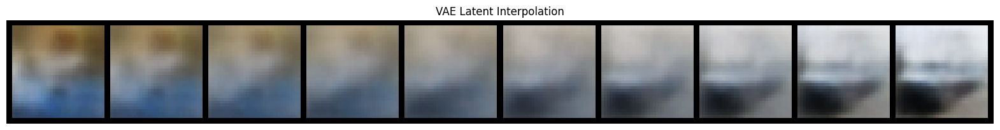

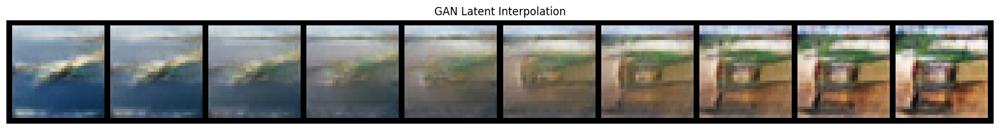

In [ ]:
def show_images(images, nrow=10, title=""):
    grid = utils.make_grid(images, nrow=nrow, normalize=True, value_range=(0, 1))
    plt.figure(figsize=(20, 4))
    plt.imshow(grid.permute(1, 2, 0).cpu().numpy())
    plt.axis("off")
    plt.title(title)
    plt.show()

# VAE interpolation

vae.eval()
(x1, _), (x2, _) = [testset[i] for i in [0, 1]]   # pick two test images
x1, x2 = x1.unsqueeze(0).to(device), x2.unsqueeze(0).to(device)

with torch.no_grad():
    mu1, logvar1 = vae.encode(x1)
    mu2, logvar2 = vae.encode(x2)
    z1 = vae.reparameterize(mu1, logvar1)
    z2 = vae.reparameterize(mu2, logvar2)

# interpolate linearly in latent space
alphas = torch.linspace(0, 1, steps=10).to(device)
interpolated = []
for a in alphas:
    z = (1 - a) * z1 + a * z2
    img = vae.decode(z)
    interpolated.append((img + 1) / 2)  # rescale from [-1,1] → [0,1]

# visualize as row of images
show_images(torch.cat(interpolated, dim=0), nrow=10, title="VAE Latent Interpolation")

# GAN interpolation
gen.eval()
z1 = torch.randn(1, 128, 1, 1, device=device)
z2 = torch.randn(1, 128, 1, 1, device=device)

alphas = torch.linspace(0, 1, steps=10).to(device)
interpolated = []
with torch.no_grad():
    for a in alphas:
        z = (1 - a) * z1 + a * z2
        img = gen(z)
        interpolated.append((img + 1) / 2)

show_images(torch.cat(interpolated), nrow=10, title="GAN Latent Interpolation")


### Latent Representation

In [32]:
vae.eval()

latents_vae = []
labels_vae = []

with torch.no_grad():
    for i, (x, y) in enumerate(testloader):
        x = x.to(device)
        z_mean, _ = vae.encode(x)   # get mean latent vector
        latents_vae.append(z_mean.cpu().numpy())
        labels_vae.append(y.numpy())
        if i > 200:   # limit for speed (200 batches ~ maybe 10k images)
            break

latents_vae = np.concatenate(latents_vae, axis=0)
labels_vae = np.concatenate(labels_vae, axis=0)


In [42]:
class DiscriminatorFeatures(nn.Module):
    def __init__(self, disc):
        super().__init__()
        self.features = nn.Sequential(*list(disc.model.children())[:-1])  # remove last Linear

    def forward(self, x):
        return self.features(x)

disc_feat = DiscriminatorFeatures(disc).to(device)


In [43]:
latents_gan = []
labels_gan = []

with torch.no_grad():
    for i, (x, y) in enumerate(testloader):
        feats = disc_feat(x.to(device))
        latents_gan.append(feats.view(feats.size(0), -1).cpu().numpy())
        labels_gan.append(y.numpy())
        if i > 200:
            break

latents_gan = np.concatenate(latents_gan, axis=0)
labels_gan = np.concatenate(labels_gan, axis=0)


In [35]:
# --- t-SNE (2D) ---
tsne = TSNE(n_components=2, perplexity=30, learning_rate=200, max_iter=1000)
latents_tsne_gan = tsne.fit_transform(latents_gan)

# --- t-SNE (2D) ---
tsne = TSNE(n_components=2, perplexity=30, learning_rate=200, max_iter=1000)
latents_tsne_vae = tsne.fit_transform(latents_vae)


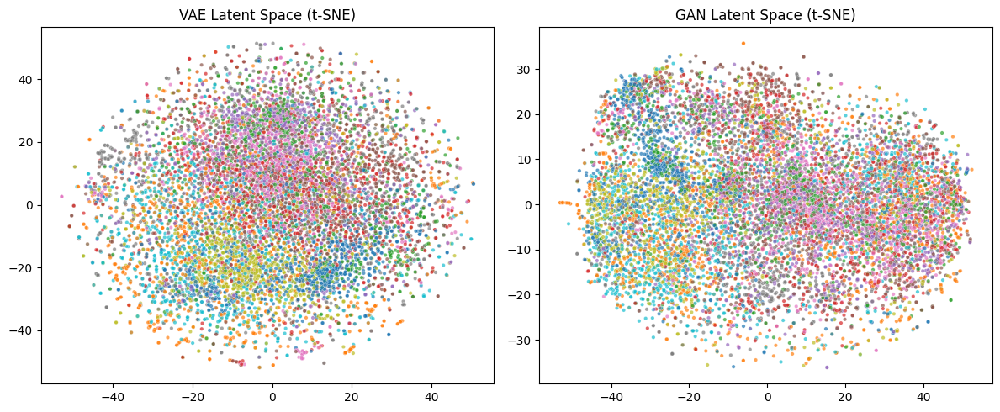

In [36]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# --- VAE t-SNE ---
sns.scatterplot(
    x=latents_tsne_vae[:, 0], y=latents_tsne_vae[:, 1],
    hue=labels_vae, palette="tab10", s=10, alpha=0.7, ax=axes[0]
)
axes[0].set_title("VAE Latent Space (t-SNE)")
axes[0].legend([], [], frameon=False)

# --- GAN t-SNE ---
sns.scatterplot(
    x=latents_tsne_gan[:, 0], y=latents_tsne_gan[:, 1],
    hue=labels_gan, palette="tab10", s=10, alpha=0.7, ax=axes[1]
)
axes[1].set_title("GAN Latent Space (t-SNE)")
axes[1].legend([], [], frameon=False)

plt.tight_layout()
plt.show()


### Semantic Factors

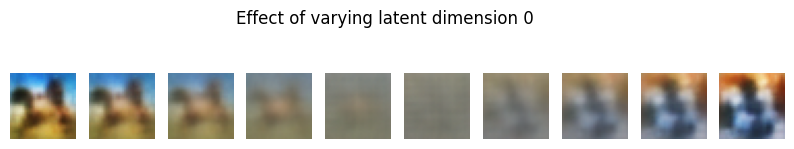

In [51]:
dim = 0
steps = 10
value_range = (-10,10)
device = "mps"

vae.eval()
latent_dim = vae.latent_dim if hasattr(vae, "latent_dim") else vae.fc_mu.out_features

with torch.no_grad():
    z = torch.zeros(latent_dim, device=device)  # start with zero vector
    grid = []
    for val in torch.linspace(value_range[0], value_range[1], steps):
        z_new = z.clone()
        z_new[dim] = val
        x_recon = vae.decode(z_new.unsqueeze(0)).cpu()
        grid.append(x_recon)

# Concatenate into a row
grid = torch.cat(grid, dim=0)
grid = grid.permute(0, 2, 3, 1)  # [N, H, W, C] for plotting

fig, axes = plt.subplots(1, steps, figsize=(steps, 2))
for i, ax in enumerate(axes):
    ax.imshow((grid[i].numpy() * 0.5 + 0.5).clip(0, 1))  # assuming [-1,1] range
    ax.axis("off")
plt.suptitle(f"Effect of varying latent dimension {dim}")
plt.show()

### VAE OOD Reconstruction

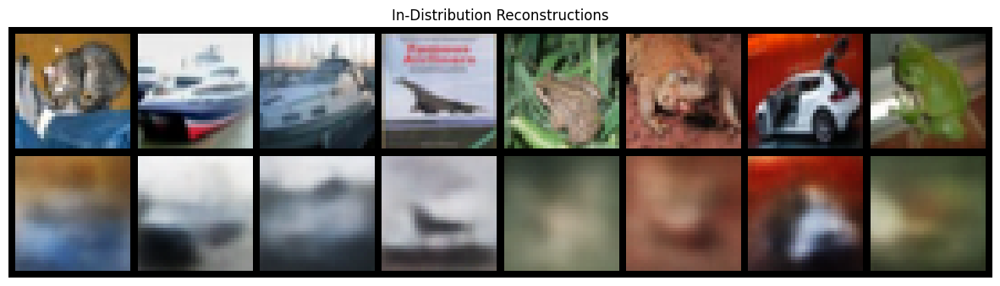

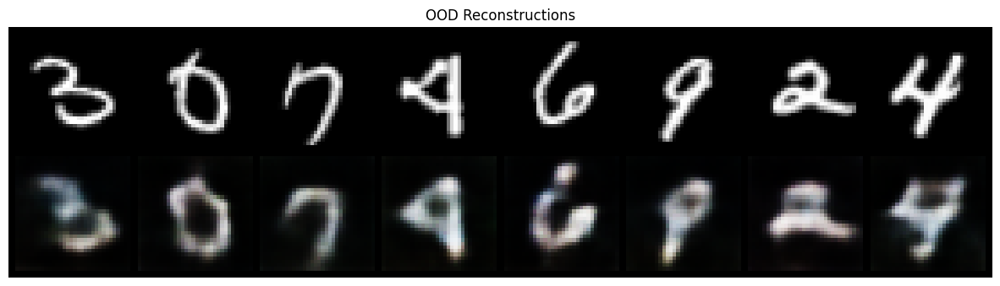

In [46]:
ood_transform = transforms.Compose([
    transforms.Resize(32),   # CIFAR-10 is 32x32
    transforms.Grayscale(num_output_channels=3),  # expand to 3 channels
    transforms.ToTensor(),
    transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5))
])
oodset = MNIST(root='./data', train=True, download=True, transform=ood_transform)
oodloader = DataLoader(oodset, batch_size=64, shuffle=True)


def show_reconstructions(vae, dataloader, n=8, title=""):
    x, _ = next(iter(dataloader))
    x = x[:n].to(device)
    with torch.no_grad():
        recon, _, _ = vae(x)
    # Stack originals and reconstructions
    imgs = torch.cat([x.cpu(), recon.cpu()], dim=0)
    grid = make_grid(imgs, nrow=n, normalize=True, value_range=(-1,1))
    plt.figure(figsize=(15,4))
    plt.imshow(grid.permute(1,2,0))
    plt.axis("off")
    plt.title(title)
    plt.show()

# Example: compare ID vs OOD
show_reconstructions(vae, testloader, title="In-Distribution Reconstructions")
show_reconstructions(vae, oodloader, title="OOD Reconstructions")

In [47]:
def recon_error(vae, dataloader, max_batches=10):
    vae.eval()
    errors = []
    with torch.no_grad():
        for i, (x, _) in enumerate(dataloader):
            if i >= max_batches: break
            x = x.to(device)
            recon, _, _ = vae(x)
            err = F.mse_loss(recon, x, reduction="none")
            err = err.view(err.size(0), -1).mean(dim=1)  # per sample
            errors.extend(err.cpu().numpy())
    return errors

id_errs = recon_error(vae, testloader)
ood_errs = recon_error(vae, oodloader)

print(f"Avg ID recon error: {np.mean(id_errs):.4f}")
print(f"Avg OOD recon error: {np.mean(ood_errs):.4f}")


Avg ID recon error: 0.0485
Avg OOD recon error: 0.0660


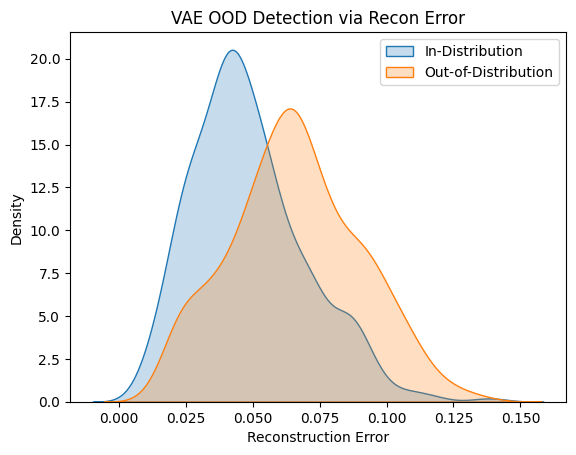

In [48]:
sns.kdeplot(id_errs, label="In-Distribution", fill=True)
sns.kdeplot(ood_errs, label="Out-of-Distribution", fill=True)
plt.xlabel("Reconstruction Error")
plt.ylabel("Density")
plt.title("VAE OOD Detection via Recon Error")
plt.legend()
plt.show()

### GAN OOD

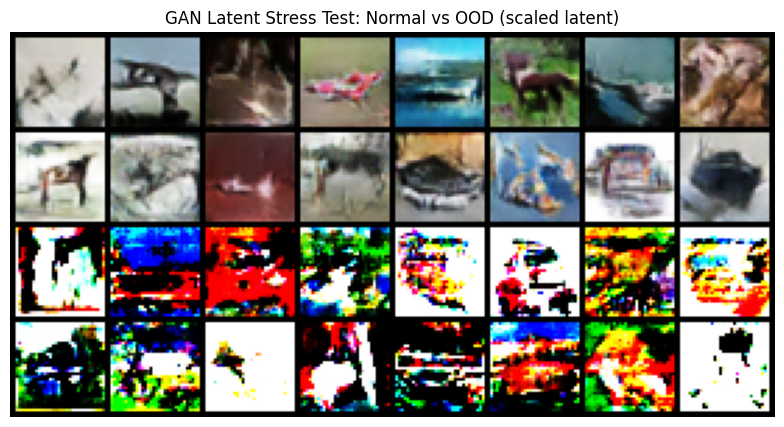

In [49]:
gen.eval()

# in-distribution latent (normal)
z_normal = torch.randn(16, z_dim, 1, 1, device=device)

# out-of-distribution latent (scaled way up)
z_big = torch.randn(16, z_dim, 1, 1, device=device) * 10.0

with torch.no_grad():
    imgs_normal = gen(z_normal)
    imgs_big = gen(z_big)

imgs = torch.cat([imgs_normal, imgs_big], dim=0)
grid = utils.make_grid((imgs+1)/2, nrow=8)

plt.figure(figsize=(15,5))
plt.imshow(grid.permute(1,2,0).cpu())
plt.axis("off")
plt.title("GAN Latent Stress Test: Normal vs OOD (scaled latent)")
plt.show()

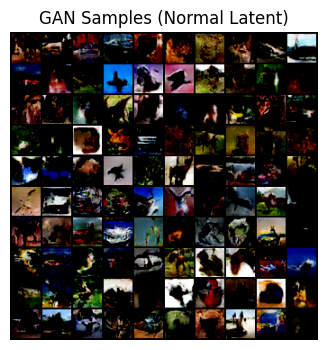

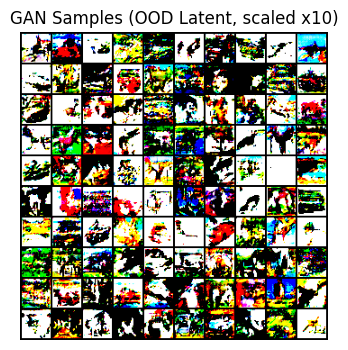

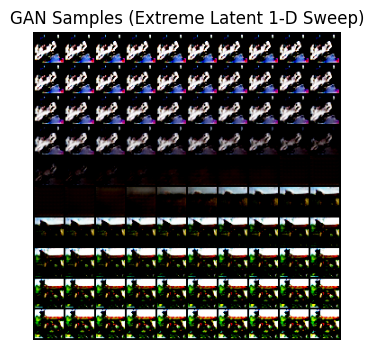

In [55]:
# Standard GAN latent samples (normal distribution)
z_dim=128
z_normal = torch.randn(100, z_dim,1,1).to(device)
fake_normal = gen(z_normal).detach().cpu()
show_images(fake_normal, title="GAN Samples (Normal Latent)")

# OOD Latent Samples (exaggerated values)
z_ood = torch.randn(100, z_dim,1,1).to(device) * 10  # scale way larger than N(0,1)
fake_ood = gen(z_ood).detach().cpu()
show_images(fake_ood, title="GAN Samples (OOD Latent, scaled x10)")

# Extreme Latent Points (single direction exaggeration)
z_extreme = torch.zeros(100, z_dim,1,1).to(device)
z_extreme[:, 0,0,0] = torch.linspace(-50, 50, 100)  # push only 1 dimension far
fake_extreme = gen(z_extreme).detach().cpu()
show_images(fake_extreme, title="GAN Samples (Extreme Latent 1-D Sweep)")

### Anomaly Detection

In [ ]:
id_errors = recon_error(vae, testloader)
ood_errors = recon_error(vae, oodloader)

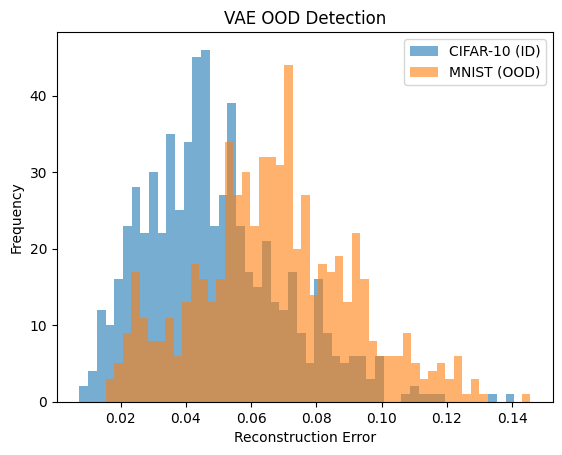

In [59]:
plt.hist(id_errors, bins=50, alpha=0.6, label="CIFAR-10 (ID)")
plt.hist(ood_errors, bins=50, alpha=0.6, label="MNIST (OOD)")
plt.legend()
plt.xlabel("Reconstruction Error")
plt.ylabel("Frequency")
plt.title("VAE OOD Detection")
plt.show()